# Time Series Wave Height and Wave Period

# Introduction

This notebook focuses on the Time Series analysis of wave and height and wave period. This includes forecasting wave height and wave period using ARIMA as well as creating a rolling dataframe for time sieries modelling using other machine learning methods. In the first part of this notebook ARIMA is used for the separate forecasts of wave height and wave period. A rolling dataframe is then created and wave height and wave period are forecasted using linear regression as a baseline model. Wave height and wave period are forecasted independently of each other, that is they do not exclude one another in the forecast. This will later be used as a comparison to wave height and wave period being forecasted simultaneously for the same day. The range in errors from both approaches will be compared to get a better sense of the relationship between wave height and wave period in forecasting for both. 

# Methodology
The first part of this analysis focuses on constructing an ARIMA model for wave height and wave period. Each feature is decomposed and tested for stationarity. The autocorrelations and partial autocorrelations are plotted to better understand the order of the ARIMA models:
- **p (AR):** Represents the number of autoregressive terms. It indicates the number of lag observations included in the model. 
- **d (I):** Stands for differencing. It represents the number of times that the raw observations are differenced to make the time series stationary. If d is 0, no differencing is performed. If d is 1, the series is differenced once, and so on.
- **q (MA):** Represents the number of moving average terms. It indicates the size of the moving average window applied to the lagged observations.
  
In summary:

- **p (AR):** The order of the autoregressive component.
- **d (I):** The order of differencing required to make the time series stationary.
- **q (MA):** The order of the moving average component.

So, the model order "pdq" in ARIMA represents how many autoregressive terms, differences, and moving average terms are used in the model. 

A base line ARIMA is then done without any optimization and used to Forecast. The ARIMA models were then optimized using the AIC score. The AIC(Aikaike Information Criterion) score is calculated as follows: 
AIC = 2k - 2 * ln(\hat{L})
where:
- k is the number of parameters in the model.
- \hat{L} is the maximum likelihood estimate of the likelihood function of the model.

The AIC score balances model fit and complexity and helps to reduce likeliehood of model overfitting. Once an optimized ARIMA was obtained it was used to forecast one day ahead and a rolling forecast method was also used. 

The next part of this analysis focused on constructing a rolling data frame to include other features in the forecast of wave height and wave period. All features were lagged creating past values of data points as variables in all rows. Further feature engineering was performed in next modelling stages. For the first modelling phase current wave height and wave period were not excluded from the forecast of one another. A baseline linear Regression was done for wave perod and wave height using the rolling data frame, because of large amount of features PCA was performed to reduce dimenstionality. A lasso regression was then done for both wave height and wave period to assess feature importance.  


# Data Dictionary

The daily imputed data will be used, containing all features expect for stn_id and Q_Flag.
<details>
  <summary>Data Dictionary</summary>
  
| Field       | Description                                             |
|-------------|---------------------------------------------------------|
| Index       | Date time excluding minutes (used to join df_buoy and df_hind) |
| DEPTH       | Depth in meters                                        |
| VWH         | Characteristic significant wave height (reported by the buoy) (m) |
| VCMX        | Maximum zero crossing wave height (reported by the buoy) (m) |
| VTP         | Wave spectrum peak period (reported by the buoy) (s)   |
| WDIR        | Direction from which the wind is blowing (° True)      |
| WDIR.1      | Estimated Direction from which the wind is blowing (° True)      |
| WSPD        | Horizontal wind speed (m/s)                           |
| WSPD.1      | Estimated wind speed within 10 meters. (m/s)
| WSS         | Horizontal scalar wind speed (m/s)                     |
| GSPD        | Gust wind speed (m/s)                                   |
| GSPD.1      | Documentation not found            |
| ATMS        | Atmospheric pressure at sea level (mbar)               |
| DRYT        | Dry bulb temperature (air temperature) (°C)            |
| SSTP        | Sea surface temperature (°C)                           |
| WD          | Wind Direction (deg from which wind is blowing (° True)) |
| WS          | Wind Speed (m/s)                                       |
| ETOT        | Total Variance of Total Spectrum (m^2)                |
| TP          | Peak Spectral Period of Total Spectrum (sec)           |
| VMD         | Vector Mean Direction of Total Spectrum (deg to which) |
| ETTSea      | Total Variance of Primary Partition (m^2)             |
| TPSea       | Peak Spectral Period of Primary Partition (sec)        |
| VMDSea      | Vector Mean Direction of Primary Partition (deg to which) |
| ETTSw       | Total Variance of Secondary Partition (m^2)           |
| TPSw        | Peak Spectral Period of Secondary Partition (sec)      |
| VMDSw       | Vector Mean Direction of Secondary Partition (deg to which) |
| MO1         | First Spectral Moment of Total Spectrum (m^2/s)       |
| MO2         | Second Spectral Moment of Total Spectrum (m^2/s^2)    |
| HS          | Significant Wave Height (m)                            |
| DMDIR       | Dominant Direction (deg to which)                       |
| ANGSPR      | Angular Spreading Function                             |
| INLINE      | In-Line Variance Ratio                                 |



In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
import pmdarima as pm

import statsmodels.api as sm
from pmdarima import auto_arima
from statsmodels.graphics.tsaplots import month_plot
import itertools
import warnings
from statsmodels.tools.sm_exceptions import ConvergenceWarning

import plotly.graph_objects as go
import plotly.express as px

from sklearn.metrics import mean_squared_error, mean_absolute_error
import plotly.express as px

from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Lasso

In [2]:
#import data 
df=pd.read_csv('../Data/df_daily_imputed.csv', index_col=0)

In [3]:
df.head()

,LATITUDE,LONGITUDE,DEPTH,VWH$,VCMX,VTP$,WDIR,WSPD,GSPD,WDIR.1,...,VMDSea,ETTSw,TPSw,VMDSw,MO1,MO2,HS,DMDIR,ANGSPR,INLINE
Datetime_buoy,,,,,,,,,,,,,,,,,,,,,
1988-11-22,48.83,126.0,73.0,5.420000,8.400000,11.640000,234.000000,11.800000,15.600000,225.000000,...,32.200000,0.844000,12.229000,63.700000,0.682000,0.564000,3.981000,67.000000,0.807500,0.715300
1988-11-23,48.83,126.0,73.0,6.657391,11.591304,14.960000,265.695652,7.491304,10.630435,256.086957,...,21.869565,0.661391,13.783913,76.808696,1.459913,1.249043,5.604522,52.469565,0.771422,0.673013
1988-11-24,48.83,126.0,73.0,4.434286,7.861905,15.097143,187.095238,6.809524,9.252381,177.619048,...,68.300000,1.774143,14.318143,75.528571,2.440857,1.881714,7.755571,75.142857,0.850457,0.765200
1988-11-25,48.83,126.0,73.0,3.676087,6.047826,13.973913,200.956522,6.026087,8.152174,191.739130,...,44.073913,1.157522,14.076913,88.278261,0.799304,0.618565,4.529000,87.786957,0.859587,0.789322
1988-11-26,48.83,126.0,73.0,3.114091,5.440909,11.930909,236.500000,5.613636,7.395455,227.227273,...,79.350000,0.711591,13.506682,76.372727,0.769818,0.690773,4.112773,89.922727,0.819845,0.757150


### General Idea of Wave Height and Wave Period over time range

In [5]:
wave_period_data = df[['VTP$']].copy()

In [6]:
wave_height_data =df[['VWH$']].copy()

Text(0.5, 1.0, 'Wave Period(s) over Time')

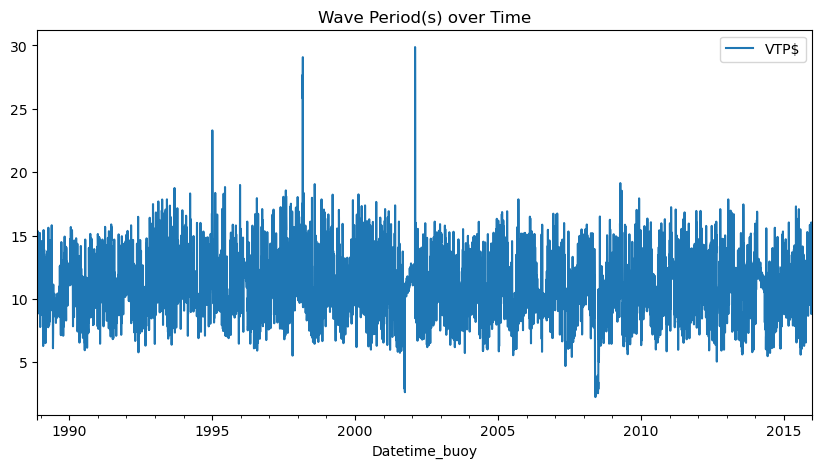

In [84]:

wave_period_data.plot(figsize=(10,5))
plt.title('Wave Period(s) over Time')

In looking at plot of wave period over entire time range, it appears that there are 3 instances where wave period spikes. This could be considered as anomoly events, or could signal issue with data quality. Moving forward data will be kept as is. Wave period also apears to have no overall trend over time range although specific trends could be present within smaller time frames. 

Text(0.5, 1.0, 'Wave Height(m) over Time')

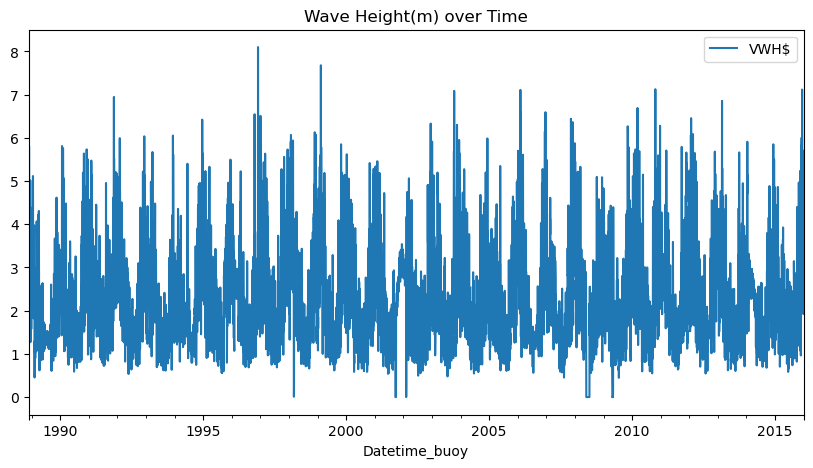

In [85]:
wave_height_data.plot(figsize=(10,5))
plt.title('Wave Height(m) over Time')

In looking at plot of wave height over entire time range there do not appear to be any major anomoly events and series overall does look to be stationary with no major trends present overtime. However trends may be present in smaller time frames. 

## Wave Height Time Series 

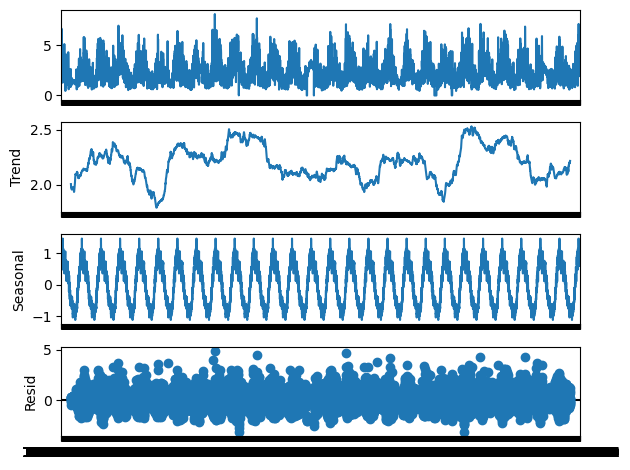

In [9]:
#decompose
result_decomp = seasonal_decompose(wave_height_data, period=365)
result_decomp.plot() #will show entire time range of data set
plt.show()

In looking at decomposition of wave height there may be trends present within smaller time frames. There is definitely a seasonal component to the series. There is still quite a lot of residuals left after the decomposition but the residuals generally exhibit a pattern. 

In [10]:
#Adfuller test function
def adfuller_test(wave_data):
    result = adfuller(wave_data)
    labels = ['ADF Test Statistic','p-val', '#Lags Used','Number of Observations Use']
    for value, label in zip(result,labels):
        print(label+':'+str(value))
    if result[1] <= 0.05:
        print('Strong evidence against the null hypothesis(Ho), reject Ho. Data has no unit root')
    else:
        print('Weak evidence against the null hypothesis(Ho), time series has a unit root, indicating non stationarity.')


In [11]:
adfuller_test(wave_height_data['VWH$'])

ADF Test Statistic:-8.459714866331037
p-val:1.5793574166664836e-13
#Lags Used:28
Number of Observations Use:9873
Strong evidence against the null hypothesis(Ho), reject Ho. Data has no unit root


Appears that series is stationary according to ADF test. 

Appears that there are stable seasonal patterns that repeat. Use an Additive model. If using auto SARIMA from the pyramid library, this will find the optimal model, so addititive or multiplicative does not need to be specified.

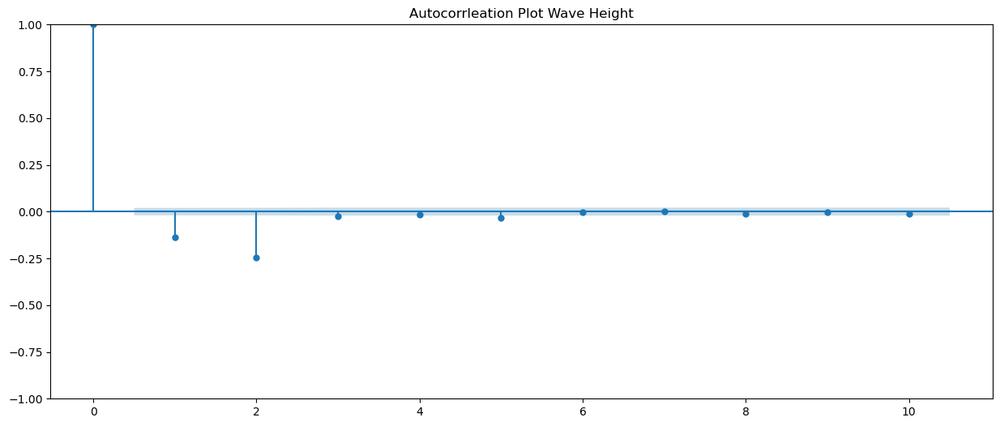

In [12]:
#Look at ACF plot 
lags= 10
fig, ax = plt.subplots(figsize=(15, 6))
plot_acf(wave_height_data.diff().dropna(),lags=lags,ax=ax) #differenced 
plt.title('Autocorrleation Plot Wave Height')
plt.show()

This ACF plot shows autocorrelations with differencing applied. The ACF plot shows the autocorrelation of a series with past values of itself. ACF plot shows spikes until 3, this shows significant autocorrelation at those lags(1-2), this is useful in deciding on the moving average component in model. This indicates that the moving average component in model may be useful. The MA order may be; q= 1 or 2.

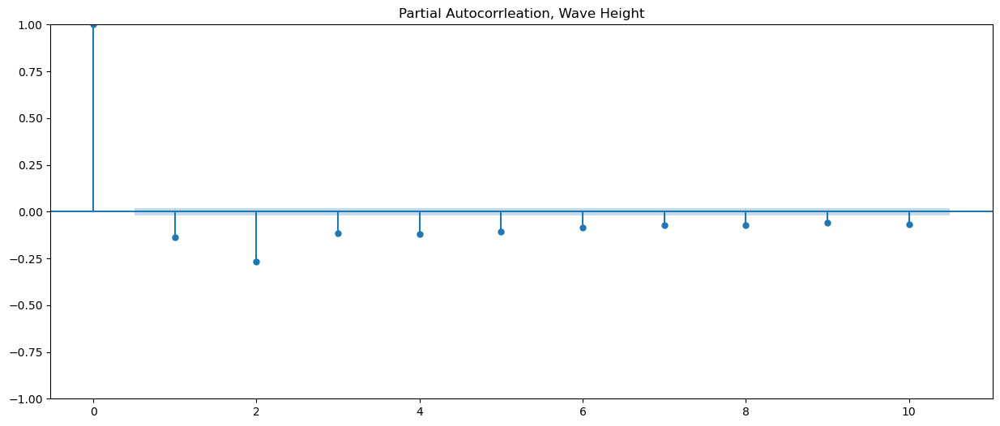

In [13]:
lags= 10
fig, ax = plt.subplots(figsize=(15, 6))
plot_pacf(wave_height_data.diff().dropna(),lags=lags,ax=ax)
plt.title('Partial Autocorrleation, Wave Height')
plt.show()

The PACF plot helps in understanding the direct relationship between the current value of a series and its specific lagged values. This PACF plot stabalizes around 3, suggeseting an order(p) in range 0-3. The correlation of the current value of series with lags 1-3 suggests that these past values be included in the model as the autoregressive components that will be used to help predict current values. 

In [14]:
wave_height_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9902 entries, 1988-11-22 to 2016-01-01
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   VWH$    9902 non-null   float64
dtypes: float64(1)
memory usage: 154.7+ KB


In [15]:
wave_height_data.index = wave_height_data.index.astype('datetime64[ns]')

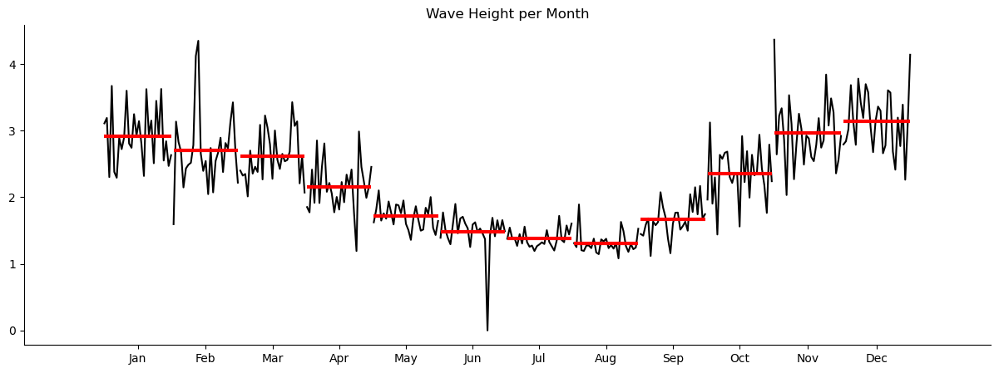

In [16]:
#create month plot of wave height
monthly_wh_data = wave_height_data['VWH$'].resample('M').mean()

plt.figure(figsize=(15, 5))

# create the seasonal plot
month_plot(monthly_wh_data, ax=plt.gca())

plt.title("Wave Height per Month")
sns.despine()
plt.show()

In looking at averages of wave height per month over entire time range it appears that wave height does follow a seasonal pattern. The fluctuations within each month do seem to vary and trends may be present within each month. 

### ARIMA Wave Height

Split wave height to train and test set.

In [17]:
#train validate split on residuals for model optimization: 
split_point = '2006-01-01'
split_point_test = '2011-01-01'
train_wh = wave_height_data[wave_height_data.index < split_point]
val_wh = wave_height_data[(wave_height_data.index>= split_point) & (wave_height_data.index < split_point_test)]
test_wh = wave_height_data[wave_height_data.index >= split_point_test]

In [18]:
wave_height_data.index = pd.to_datetime(wave_height_data.index)


**Functions for Time Series**

In [19]:
#function to optimize arima with aic score
def optimize_arima_aic(train_data, p_range, d_values, q_range, trend_options):
    """
    Function to optimize ARIMA and return DataFrame with results.
    
    Params:
    - train_data: Time series data for training
    - p_range: Range of p values
    - d_values: List of d values
    - q_range: Range of q values
    - trend_options: List of trend options
    """
    # Generate all possible combinations of pdq and trend
    pdqt = list(itertools.product(p_range, d_values, q_range, trend_options))
    
    # Create an empty DataFrame to store results
    result_pdqt = pd.DataFrame(columns=['pdqt', 'AIC'])
    
    # Suppress convergence warnings
    with warnings.catch_warnings():
        warnings.simplefilter("ignore", category=ConvergenceWarning)
        
        # List of DataFrames to concatenate to results DataFrame
        dfs_to_concat = []
        
        # Iterate over all combinations
        for param in pdqt:
            try:
                order = param[:3]  # Extract pdq
                trend = param[3]   # Extract trend

                model_arima = sm.tsa.SARIMAX(train_data, order=order, trend=trend)
                result_i = pd.DataFrame({'pdqt': [param], 'AIC': [model_arima.fit(disp=False).aic]})
                dfs_to_concat.append(result_i)
            except Exception as e:
                print(f"Exception in iteration with param {param}: {e}")
                continue
        
        # Concatenate DataFrames from iterations to results DataFrame
        result_pdqt = pd.concat(dfs_to_concat, ignore_index=True)

    # Find the best parameters based on the lowest AIC score
    best_params = result_pdqt.loc[result_pdqt['AIC'].astype(float).idxmin()]['pdqt']
    
    # Fit the ARIMA model with the best parameters
    best_model = sm.tsa.SARIMAX(train_data, order=best_params[:3], trend=best_params[3])
    final_model = best_model.fit(disp=False)
    
    # Return both the results DataFrame and the best parameters
    return result_pdqt, best_params, final_model


In [20]:
def forecast_and_plot(model, wave_data, split_point, split_point_test, column_name='VWH$', is_validation=True):
    """
    Forecast on the validation or test set, create a plot with predictions,
    and calculate MSE and MAE for forecasted values.
    
    Params:
    - model: Fitted ARIMA model
    - wave_data: DataFrame with wave data
    - split_point: Date to split training and validation/test sets
    - split_point_test: Date to split validation and test sets
    - column_name: Column name for the wave data (default is 'VWH$')
    - is_validation: Flag indicating whether it's the validation set (default is True)
    
    Returns:
    - mse: Mean Squared Error
    - mae: Mean Absolute Error
    """
    # Exclude the validation/test set from the index when selecting the training set
    train_data = wave_data[wave_data.index < split_point]

    # Define the start and end dates based on whether it's the validation or test set
    if is_validation:
        start_eval = split_point
        end_eval = split_point_test
        title = 'True Values vs Predictions (Validation Set)'
    else:
        start_eval = split_point_test 
        end_eval = wave_data.index[-1]
        title = 'True Values vs Predictions (Test Set)'

    # Forecast on the validation or test set with a rolling window
    forecast = model.predict(start=start_eval, end=end_eval, dynamic=False)

    result_df = pd.DataFrame({'True Values': wave_data[(wave_data.index >= split_point) & (wave_data.index <= end_eval)][column_name].values,
                              'Predictions': forecast})

    # Plot true values and predictions for validation or test set using Plotly
    fig = px.line(result_df, x=result_df.index, y=['True Values', 'Predictions'],
                  labels={'value': 'Values', 'variable': 'Type'},
                  title=title,
                  template='plotly_dark')
    fig.show()

    # Calculate MSE and MAE for validation or test set
    mse = mean_squared_error(result_df['True Values'], result_df['Predictions'])
    mae = mean_absolute_error(result_df['True Values'], result_df['Predictions'])

    # Print the results
    print(f'Mean Squared Error (MSE): {mse}')
    print(f'Mean Absolute Error (MAE): {mae}')

    return mse, mae


In [21]:
def forecast_Rolling_plot(model, wave_data, split_point, split_point_test, window_size, is_validation=True, column_name='VWH$'):
    """
    Perform rolling forecasts on the validation or test set, create an interactive plot with Plotly,
    and calculate MSE and MAE for forecasted values.
    
    Parameters:
    - model: Fitted ARIMA model
    - wave_data: DataFrame containing wave data (height or period)
    - split_point: Date to split training and validation/test sets
    - split_point_test: Date to split validation and test sets
    - window_size: Size of the rolling window
    - is_validation: Flag indicating whether it's the validation set (default is True)
    - column_name: Name of the column to use for plotting (default is 'VWH$')
    
    Returns:
    - mse: Mean Squared Error
    - mae: Mean Absolute Error
    """
    
    # Exclude the validation/test set from the index when selecting the training set
    train_wave_data = wave_data[wave_data.index < split_point]
    
    if is_validation:
        eval_data = wave_data[wave_data.index >= split_point]
        title = 'True Values vs Predictions (Validation) - Rolling Window'
    else:
        eval_data = wave_data[wave_data.index >= split_point_test]
        title = 'True Values vs Predictions (Test) - Rolling Window'

    # Initialize lists to store forecasted values, MSE, and MAE
    forecast_values = []
    mse_list = []
    mae_list = []

    # Perform rolling forecasts
    for i in range(0, len(eval_data), window_size):
        start_idx = i  # define the current window, start and end are based on the window size
        end_idx = min(i + window_size - 1, len(eval_data) - 1)

        # Forecast on the current window
        forecast = model.predict(start=start_idx, end=end_idx, dynamic=False)

        # Append forecasted values to the list
        forecast_values.extend(forecast)

        # Calculate MSE and MAE for the current window
        mse = mean_squared_error(eval_data[start_idx:end_idx + 1], forecast)
        mae = mean_absolute_error(eval_data[start_idx:end_idx + 1], forecast)

        # Append MSE and MAE to the lists
        mse_list.append(mse)
        mae_list.append(mae)

    # Create an interactive plot with Plotly
    fig = go.Figure()

    # Add true values to the plot
    fig.add_trace(go.Scatter(x=eval_data.index, y=eval_data[column_name], mode='lines', name='True Values'))

    # Add predicted values to the plot
    fig.add_trace(go.Scatter(x=eval_data.index, y=forecast_values, mode='lines', name='Predictions'))

    # Customize the layout
    fig.update_layout(title=title,
                      xaxis_title='Date',
                      yaxis_title='Values',
                      showlegend=True)

    # Show the Plotly plot
    fig.show()

    # Calculate overall MSE and MAE for all forecasted values
    overall_mse = mean_squared_error(eval_data[column_name], forecast_values)
    overall_mae = mean_absolute_error(eval_data[column_name], forecast_values)

    # Print the overall results
    print(f'Overall Mean Squared Error (MSE): {overall_mse}')
    print(f'Overall Mean Absolute Error (MAE): {overall_mae}')

    return overall_mse, overall_mae


In [22]:
train_wh.index = pd.to_datetime(train_wh.index)
train_wh.index.freq = 'D'

<Axes: xlabel='Datetime_buoy'>

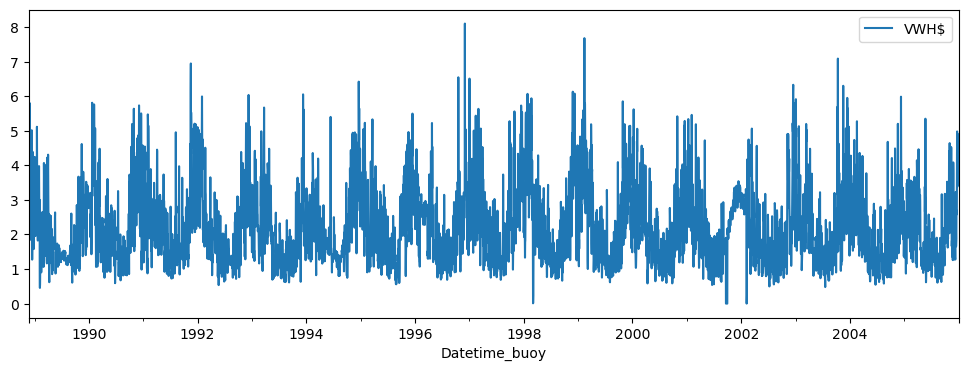

In [23]:
train_wh.plot(figsize=(12,4))

### ARIMA and forecast without optimization, Wave Height

In [86]:

model = sm.tsa.SARIMAX(train_wh, order = (1, 1, 1)) #pdq all set to one to begin and get a baseline.
model_fit = model.fit();
forecast= model_fit.forecast(20)

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.03363D+00    |proj g|=  8.20235D-02

At iterate    5    f=  1.01802D+00    |proj g|=  1.58028D-02

At iterate   10    f=  1.01074D+00    |proj g|=  1.67312D-04


 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     14     18      1     0     0   8.073D-07   1.011D+00
  F =   1.0107378239830211     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


In [25]:
#Summary of model
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                   VWH$   No. Observations:                 6249
Model:               SARIMAX(1, 1, 1)   Log Likelihood               -6316.101
Date:                Thu, 01 Feb 2024   AIC                          12638.201
Time:                        19:21:21   BIC                          12658.421
Sample:                    11-22-1988   HQIC                         12645.209
                         - 12-31-2005                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5886      0.011     54.593      0.000       0.567       0.610
ma.L1         -0.9375      0.005   -190.244      0.000      -0.947      -0.928
sigma2         0.4421      0.005     90.148      0.000       0.432       0.452
===================================================================================
Ljung-Box (L1) (Q):                  11.22   Jarque-Bera (JB):              3653.80
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               1.04   Skew:                             0.94
Prob(H) (two-sided):                  0.40   Kurtosis:                         6.24
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

The lag 1, for moving average and autoregressive component is statistically significant with a p value of 0. This can be taken into consideration when optimizing ARIMA with AIC score, optimization can begin with ranges of pdq starting at 1. 

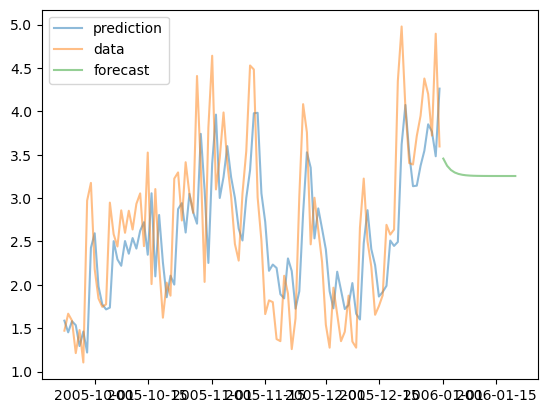

In [26]:
#Plot forecast in comparison to actual and predictions from train set.
plt.plot(model_fit.predict()[-100:], label = 'prediction', alpha=0.5)
plt.plot(train_wh[-100:], label = 'data', alpha=0.5)
plt.plot(forecast, label= 'forecast', alpha=0.5)
plt.legend()

**Results** Predictions from Arima look close to actual values, however when forecast is used the model converges to a straight line, as predictions are being made on previous predictions. 

**Optimize ARIMA with AIC score** 

Functions defined earlier will be used to optimize ARIMA using the AIC score. For the purpose of this analysis trend will be kept set to 'c'(constant).

In [87]:
#Optimize Arima for Wave Height
p_range = range(1,3)
d_values = [1]
q_range = range(1,2)
trend_options = ['c'] #trend component set to constant 

result, best_params, final_model=optimize_arima_aic(train_wh, p_range, d_values, q_range, trend_options)
print(f'Best ARIMA parameters: {best_params}')
print(result)

Best ARIMA parameters: (2, 1, 1, 'c')
           pdqt           AIC
0  (1, 1, 1, c)  12640.198128
1  (2, 1, 1, c)  12604.111990


                               SARIMAX Results                                
Dep. Variable:                   VWH$   No. Observations:                 6249
Model:               SARIMAX(2, 1, 1)   Log Likelihood               -6297.056
Date:                Thu, 01 Feb 2024   AIC                          12604.112
Time:                        19:21:25   BIC                          12637.812
Sample:                    11-22-1988   HQIC                         12615.791
                         - 12-31-2005                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept  -3.835e-05      0.001     -0.051      0.959      -0.002       0.001
ar.L1          0.6154      0.011     54.022      0.000       0.593       0.638
ar.L2         -0.0845      0.011     -7.596      0.0

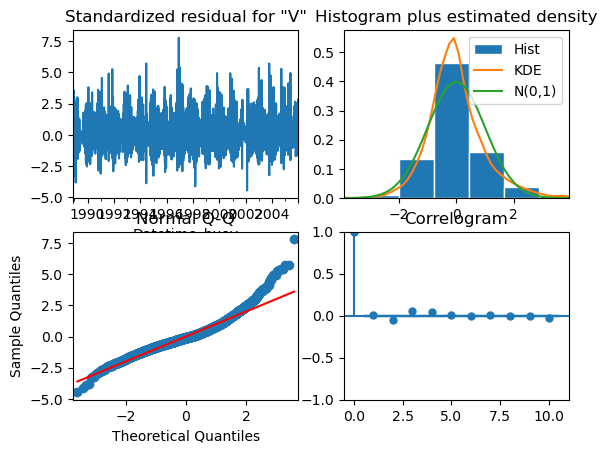

In [28]:
wh_model = final_model
results_model = final_model.summary()
print(results_model)
final_model.plot_diagnostics()
plt.show()

In model results all lags for moving average as well as autoregressive order are statistically significant with a p value < 0.05. The residuals generally follow a normal distribution suggesting the model is capturing th systematic patterns well. 

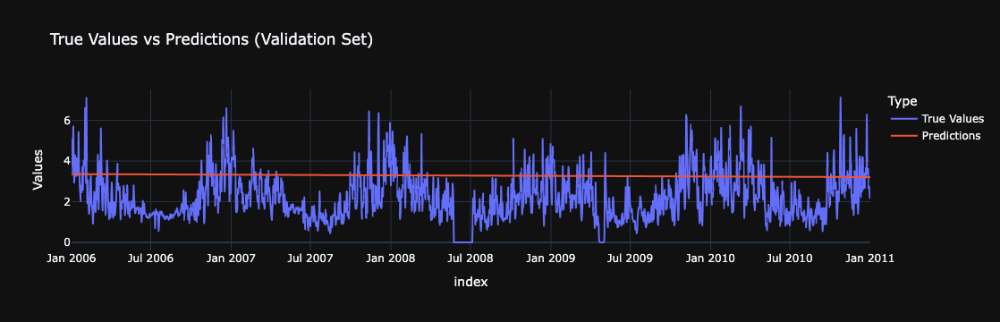

Mean Squared Error (MSE): 2.476048283461567
Mean Absolute Error (MAE): 1.3670716291939065


(2.476048283461567, 1.3670716291939065)

In [29]:
#forecast with ARIMA, no Rolling forecast
forecast_and_plot(wh_model, wave_height_data, split_point, split_point_test, column_name='VWH$', is_validation=True)

Note: code for function for predictions on validation set may need to be adjusted for future use. However for the purpose of this analysis further adjustments were not made. 

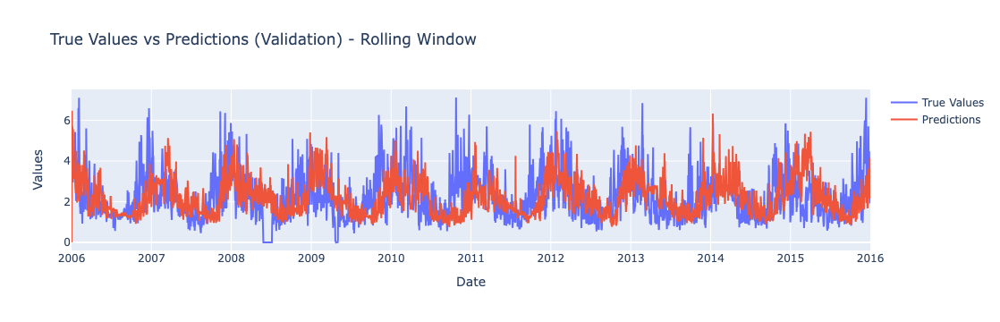

Overall Mean Squared Error (MSE): 1.4765367274552827
Overall Mean Absolute Error (MAE): 0.9137437361626162


In [83]:
#Rolling forecast with ARIMA
window_size =1
mse, mae =forecast_Rolling_plot(wh_model, wave_height_data, split_point, split_point_test, window_size, is_validation=True, column_name='VWH$')

**Results:** While Forecasting with ARIMA without a rolling Forecast does give prediction 1 day ahead the forecast eventually converges to a straight line as the model keeps using predictions to predict future values. Using a rolling forecast methods allows for the one day predictions to be visualized across entire test time range. Evaluation of function was done to ensure that no data leakage was occuring. 

## Wave Period Time Series

<Figure size 600x2000 with 0 Axes>

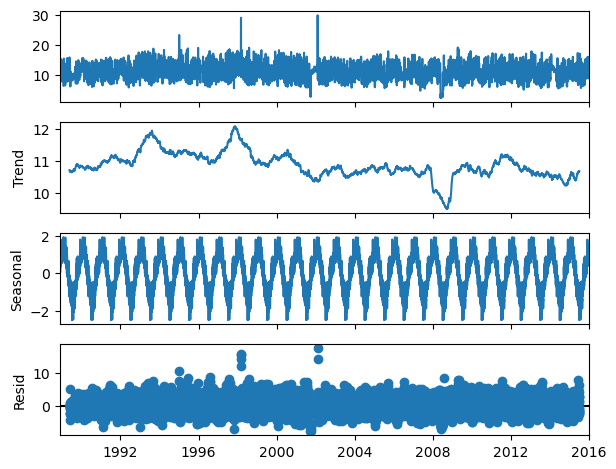

In [91]:
#decompose
result_decomp = seasonal_decompose(wave_period_data, period=365)
plt.figure(figsize=(6,20)) #Note cannot seem to expand figure
result_decomp.plot() #will show entire time range of data set
plt.show()

In looking at the decompostion of wave period, it appears that there may be a slight general trend in the series although ADF test shows stationarity, this may be taken into account when differencing. There is a seasonal component that has been isolated and the residuals show anomolies or outliers in the series, although the residuals generally follow a pattern. 

In [32]:
adfuller_test(wave_period_data['VTP$'])

ADF Test Statistic:-8.344663795179114
p-val:3.1086885108799965e-13
#Lags Used:37
Number of Observations Use:9864
Strong evidence against the null hypothesis(Ho), reject Ho. Data has no unit root


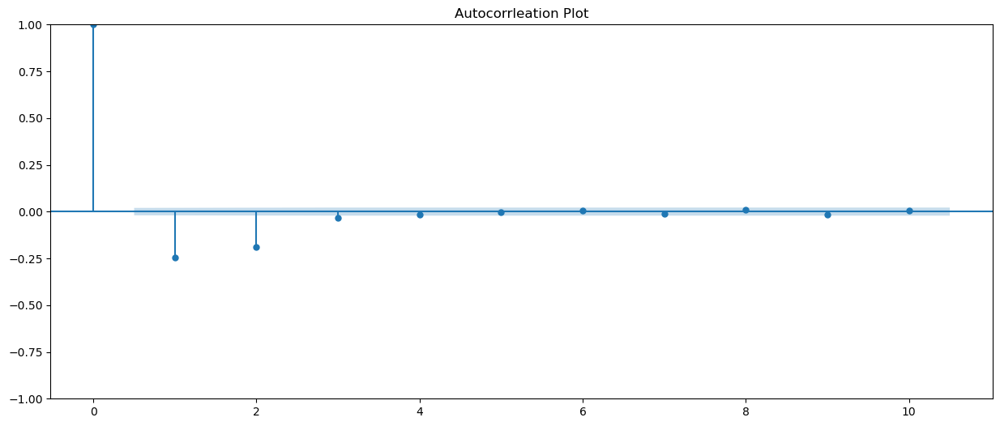

In [33]:
#Look at ACF plot 
lags= 10
fig, ax = plt.subplots(figsize=(15, 6))
plot_acf(wave_period_data.diff().dropna(),lags=lags,ax=ax) #differenced 
plt.title('Autocorrleation Plot')
plt.show()

In assessing the ACF plot with differencing, autocorrelation appears to be significant from lags 1-3, this will help determine the order of the moving average(q) in optimizing the ARIMA. 

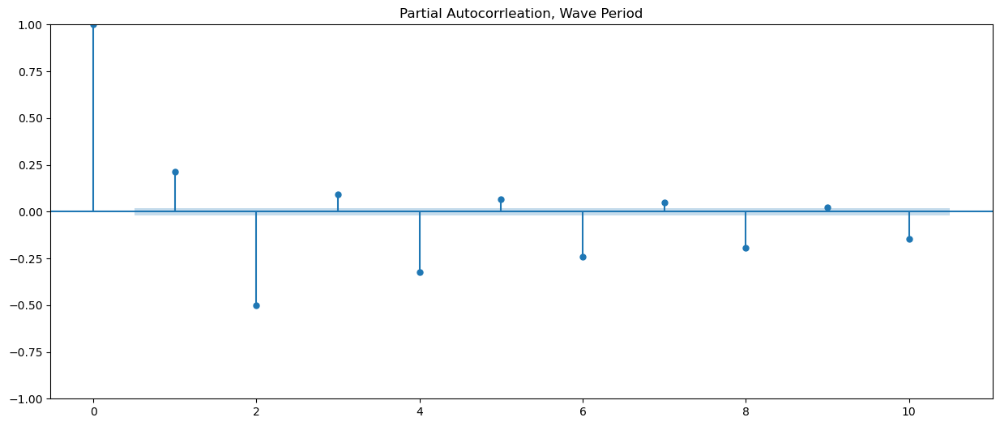

In [34]:
lags= 10
fig, ax = plt.subplots(figsize=(15, 6))
plot_pacf(wave_period_data.diff(2).dropna(),lags=lags,ax=ax)
plt.title('Partial Autocorrleation, Wave Period')
plt.show()

In assessing the PACF plot with a differencing done of 2, it shows alternating spikes that consistently decrease. This could show an AR component (p) with a seasonal lag in the data. 

In [35]:
wave_period_data.index = pd.to_datetime(wave_period_data.index)

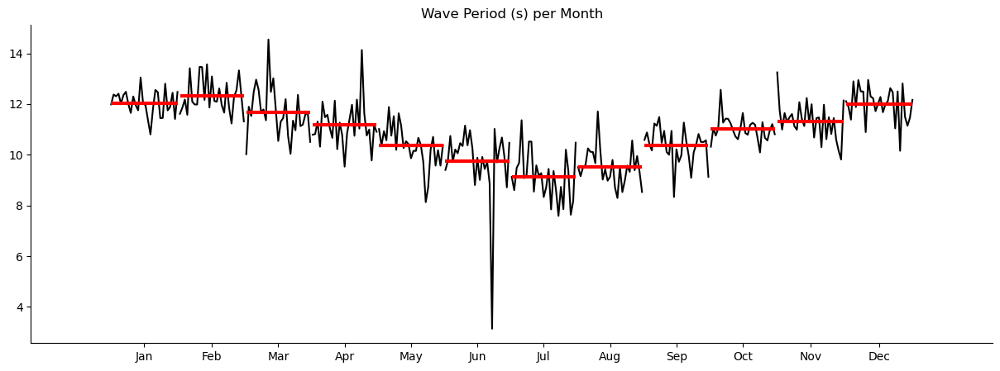

In [36]:
#create month plot of wave height
monthly_wp_data = wave_period_data['VTP$'].resample('M').mean()

plt.figure(figsize=(15, 5))

# create the seasonal plot
month_plot(monthly_wp_data, ax=plt.gca())

plt.title("Wave Period (s) per Month")
sns.despine()
plt.show()

In looking at the average values for wave period per month over entire time range of dataset it appears that wave period generally follows a seasonal patter. There large decrease in wave period around June could suggest an anomoly or outlier. 

### ARIMA Wave Period

In [37]:
#train validate split on residuals for model optimization: 
split_point = '2006-01-01'
split_point_test = '2011-01-01'
train_wp = wave_period_data[wave_period_data.index < split_point]
val_wp = wave_period_data[(wave_period_data.index>= split_point) & (wave_period_data.index < split_point_test)]
test_wp = wave_period_data[wave_period_data.index >= split_point_test]

In [38]:
train_wp.index = pd.to_datetime(train_wh.index)
train_wp.index.freq = 'D'

### ARIMA and forecasting without optimization, Wave Period¶

In [39]:
model_wp = sm.tsa.SARIMAX(train_wp, order = (1, 1, 1))
model_fit_wp = model_wp.fit();
forecast_wp= model_fit_wp.forecast(20)

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.07095D+00    |proj g|=  1.01576D-01

At iterate    5    f=  2.04862D+00    |proj g|=  2.43084D-02

At iterate   10    f=  2.04636D+00    |proj g|=  5.16450D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     11     14      1     0     0   1.705D-06   2.046D+00
  F =   2.0463552288662350     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


In [40]:
model_fit_wp.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                   VTP$   No. Observations:                 6249
Model:               SARIMAX(1, 1, 1)   Log Likelihood              -12787.674
Date:                Thu, 01 Feb 2024   AIC                          25581.348
Time:                        19:22:21   BIC                          25601.568
Sample:                    11-22-1988   HQIC                         25588.355
                         - 12-31-2005                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4341      0.010     43.346      0.000       0.414       0.454
ma.L1         -0.9548      0.004   -243.799      0.000      -0.962      -0.947
sigma2         3.5086      0.038     92.012      0.000       3.434       3.583
===================================================================================
Ljung-Box (L1) (Q):                   2.96   Jarque-Bera (JB):              3930.79
Prob(Q):                              0.09   Prob(JB):                         0.00
Heteroskedasticity (H):               1.33   Skew:                             0.74
Prob(H) (two-sided):                  0.00   Kurtosis:                         6.59
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

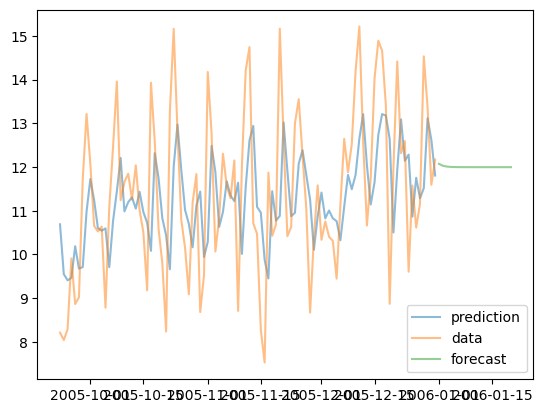

In [41]:
plt.plot(model_fit_wp.predict()[-100:], label = 'prediction', alpha=0.5)
plt.plot(train_wp[-100:], label = 'data', alpha=0.5)
plt.plot(forecast_wp, label= 'forecast', alpha=0.5)
plt.legend()

**Results** The predictions are close to actual values. When forecasting for one day window forecast converges to a straight line as predictions are made on previous predictions. 

### Optimize ARIMA 

Initail value range for orders pdq is based off of the ACF and PACF plot. The PACF plot for the oder for p does suggest a seasonal component, howerver this was not added and just an ARIMA was done. However adding Seasonal components could be a done creating a SARIMA model, that could then be compared to the rest of the modelling techniques used in this project. 

In [92]:
#Optimize Arima for Wave Height
p_range = range(1,3)
d_values = range(1,2)
q_range = range(1,3)
trend_options = ['c']

result, best_params, final_model=optimize_arima_aic(train_wp, p_range, d_values, q_range, trend_options)
print(f'Best ARIMA parameters: {best_params}')
print(result)

Best ARIMA parameters: (1, 1, 2, 'c')
           pdqt           AIC
0  (1, 1, 1, c)  25583.346368
1  (1, 1, 2, c)  25566.574387
2  (2, 1, 1, c)  25568.147618
3  (2, 1, 2, c)  25567.391899


                               SARIMAX Results                                
Dep. Variable:                   VTP$   No. Observations:                 6249
Model:               SARIMAX(1, 1, 2)   Log Likelihood              -12778.287
Date:                Thu, 01 Feb 2024   AIC                          25566.574
Time:                        19:22:27   BIC                          25600.274
Sample:                    11-22-1988   HQIC                         25578.254
                         - 12-31-2005                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   -5.17e-05      0.001     -0.036      0.971      -0.003       0.003
ar.L1          0.3165      0.025     12.779      0.000       0.268       0.365
ma.L1         -0.8137      0.027    -30.117      0.0

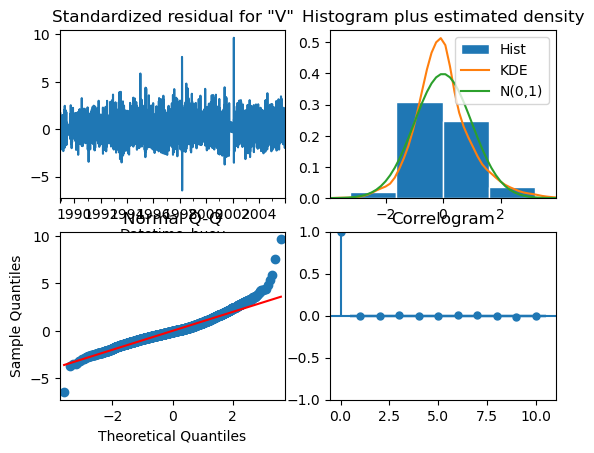

In [43]:
wp_model = final_model
results_model = wp_model.summary()
print(results_model)
wp_model.plot_diagnostics()
plt.show()

All lags for moving average (q) and autogressive oder (p) are statistically significant with p value <0.05. The residuals also display normality suggesting that the model is capturing sytematic patterns generally well.

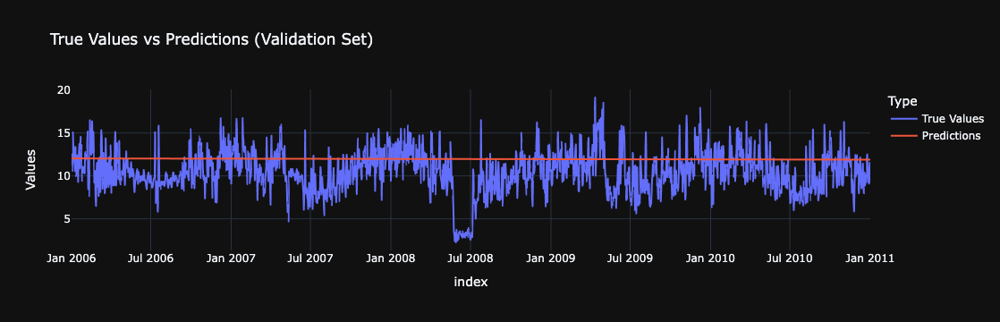

Mean Squared Error (MSE): 8.30028443529542
Mean Absolute Error (MAE): 2.281335164906199


(8.30028443529542, 2.281335164906199)

In [82]:
#use function to forecast without rolling forecast
forecast_and_plot(wp_model, wave_period_data, split_point, split_point_test, column_name='VTP$', is_validation=True)

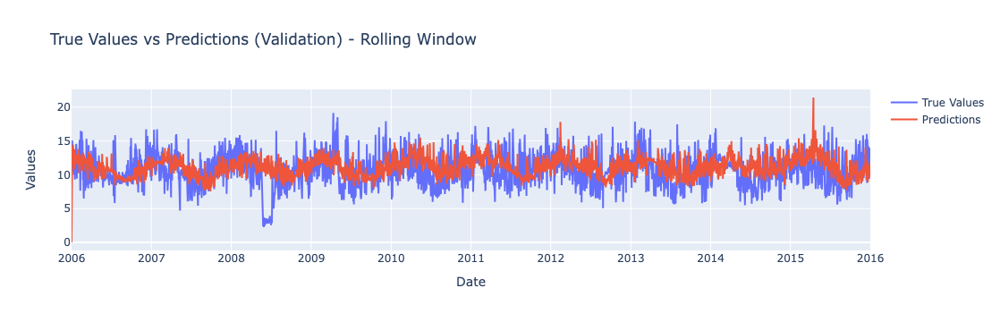

Overall Mean Squared Error (MSE): 6.949078304090905
Overall Mean Absolute Error (MAE): 2.0633793719182045


In [45]:
window_size =1
mse, mae =forecast_Rolling_plot(wp_model, wave_period_data, split_point, split_point_test, window_size, is_validation=True, column_name='VTP$')

### SARIMA 
For further optimization of this forecasting technique seasonal components may be added as well as exogenous variables. 

# Create New DataFrame for Supervised Machine Learning

The last part of this notebook focuses on creating a rolling data frame to incorporate past values of other features into the forecast of wave height and wave period. 

In [46]:
# convert directions(degrees North) into radians
columns_to_convert = ['VMD', 'VMDSea', 'VMDSw', 'WD', 'WDIR', 'WDIR.1']

# Convert specified columns to radians
df[columns_to_convert] = np.radians(df[columns_to_convert])

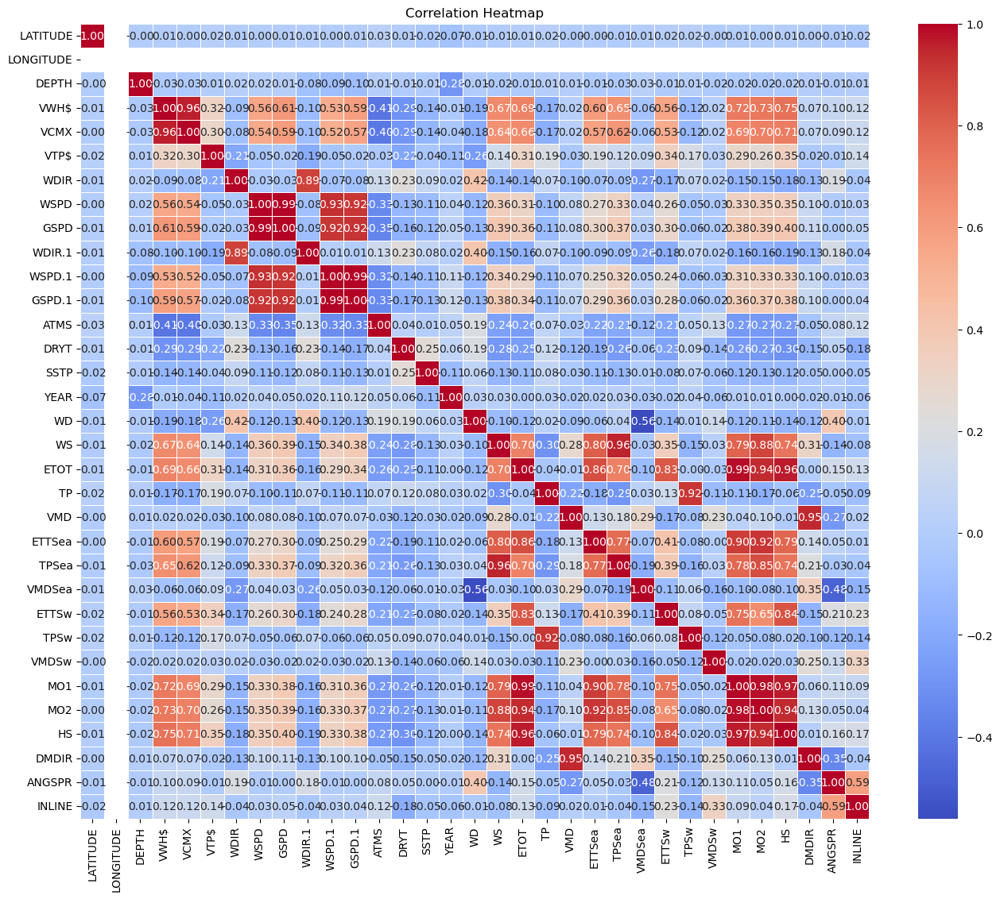

In [47]:
correlation_matrix = df.corr()

# Create a heatmap using Seaborn
plt.figure(figsize=(16, 13))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title("Correlation Heatmap")
plt.show()

### Create Features for Linear Regression

In [48]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9902 entries, 1988-11-22 to 2016-01-01
Data columns (total 33 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   LATITUDE   9902 non-null   float64
 1   LONGITUDE  9902 non-null   float64
 2   DEPTH      9902 non-null   float64
 3   VWH$       9902 non-null   float64
 4   VCMX       9902 non-null   float64
 5   VTP$       9902 non-null   float64
 6   WDIR       9902 non-null   float64
 7   WSPD       9902 non-null   float64
 8   GSPD       9902 non-null   float64
 9   WDIR.1     9902 non-null   float64
 10  WSPD.1     9902 non-null   float64
 11  GSPD.1     9902 non-null   float64
 12  ATMS       9902 non-null   float64
 13  DRYT       9902 non-null   float64
 14  SSTP       9902 non-null   float64
 15  YEAR       9902 non-null   float64
 16  WD         9902 non-null   float64
 17  WS         9902 non-null   float64
 18  ETOT       9902 non-null   float64
 19  TP         9902 non-null   float64
 20

In [49]:
# Define lags for different time intervals
lags = {'1_day': 1, '1_week': 7, '1_month': 30}

# Rolling window size for averages and std deviations
rolling_window_avg = 3
rolling_window_std = 3

# Create a new DataFrame to avoid modifying the original DataFrame in place
new_df = pd.DataFrame()

# Create lags, rolling averages, and std deviations for all numeric columns
for column in df.select_dtypes(include='number').columns:
    # Create lags for different time intervals
    for lag_name, lag_value in lags.items():
        new_df[f'{column}_lag_{lag_name}'] = df[column].shift(lag_value)

    # Create rolling averages with a window size of 3 days
    new_df[f'{column}_rolling_avg'] = df[column].rolling(window=rolling_window_avg).mean()

    # Create rolling standard deviations with a window size of 3 days
    new_df[f'{column}_rolling_std'] = df[column].rolling(window=rolling_window_std).std()

# Combine the new features with the original DataFrame
features_df = pd.concat([df, new_df], axis=1)

# Drop rows with null values
features_df = features_df.dropna()

# Display the modified DataFrame
print(features_df.head())


               LATITUDE  LONGITUDE  DEPTH      VWH$      VCMX       VTP$  \
Datetime_buoy                                                              
1988-12-22        48.83      126.0   73.0  3.290833  5.575000  11.315417   
1988-12-23        48.83      126.0   73.0  4.212500  7.262500  14.342917   
1988-12-24        48.83      126.0   73.0  3.097917  5.441667  12.101250   
1988-12-25        48.83      126.0   73.0  2.649583  4.458333  11.237917   
1988-12-26        48.83      126.0   73.0  1.576250  2.675000   9.538333   

                   WDIR      WSPD       GSPD    WDIR.1  ...  ANGSPR_lag_1_day  \
Datetime_buoy                                           ...                     
1988-12-22     4.246968  7.875000  10.100000  4.076798  ...          0.739500   
1988-12-23     5.145085  4.970833   7.179167  4.983642  ...          0.866262   
1988-12-24     2.620903  3.300000   4.666667  4.218606  ...          0.851450   
1988-12-25     2.390374  2.191667   3.345833  3.257221  ...   

/var/folders/h5/pnqm5hvd2vj1397_ck_gmtj00000gn/T/ipykernel_89647/2312465262.py:15: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/var/folders/h5/pnqm5hvd2vj1397_ck_gmtj00000gn/T/ipykernel_89647/2312465262.py:15: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/var/folders/h5/pnqm5hvd2vj1397_ck_gmtj00000gn/T/ipykernel_89647/2312465262.py:15: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd

In [50]:
features_df.index

Index(['1988-12-22', '1988-12-23', '1988-12-24', '1988-12-25', '1988-12-26',
       '1988-12-27', '1988-12-28', '1988-12-29', '1988-12-30', '1988-12-31',
       ...
       '2015-12-23', '2015-12-24', '2015-12-25', '2015-12-26', '2015-12-27',
       '2015-12-28', '2015-12-29', '2015-12-30', '2015-12-31', '2016-01-01'],
      dtype='object', name='Datetime_buoy', length=9872)

**Linear Regression without cross validation and pipeline on Wave Height**

In [51]:
#split on date for train and test
split_point = '2006-01-01'
#filter data on split point
train_linreg= features_df.index < split_point
test_linreg = features_df.index >= split_point

In [52]:
#define X and y
X_train = features_df[train_linreg].drop(['VWH$'],axis=1)
y_wh_train = features_df[train_linreg]['VWH$']

X_test = features_df[test_linreg].drop(['VWH$'], axis=1)
y_wh_test = features_df[test_linreg]['VWH$']

In [53]:
X_train.shape

(6219, 197)

In [54]:
y_wh_train.shape

(6219,)

In [55]:
#PCA and Scale
pca = PCA(n_components=0.95)
scaler = StandardScaler()
#fit and transform to train X, transform test X
X_train_pca = pca.fit_transform(scaler.fit_transform(X_train))
X_test_pca = pca.transform(scaler.transform(X_test))

MSE Wave Height: 0.17186523040705362
MAE Wane Height: 0.30304353849115173


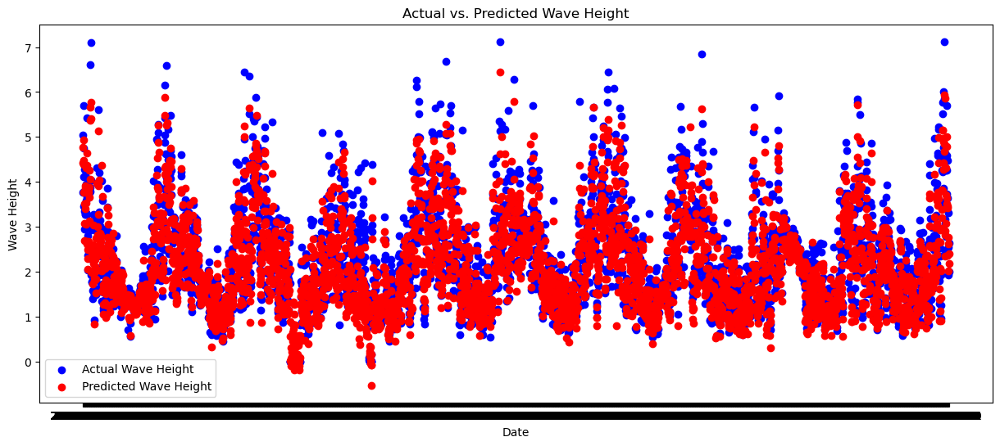

In [56]:
#Linear Regression
model_linreg = LinearRegression()
model_linreg.fit(X_train_pca, y_wh_train)

#Predict
y_wh_pred = model_linreg.predict(X_test_pca)

#Calculate MSE and MAE
mse_wh = mean_squared_error(y_wh_test,y_wh_pred)
mae_wh = mean_absolute_error(y_wh_test,y_wh_pred)
#Print MSE and MAE
print("MSE Wave Height:", mse_wh)
print("MAE Wane Height:", mae_wh)

#Plot Linear Reg. with predictions and acutal values
plt.figure(figsize=(15, 6))
plt.scatter(features_df.index[test_linreg], y_wh_test, label='Actual Wave Height', color='blue')
plt.scatter(features_df.index[test_linreg], y_wh_pred, label='Predicted Wave Height', color='red')
plt.xlabel('Date')
plt.ylabel('Wave Height')
plt.legend()
plt.title('Actual vs. Predicted Wave Height')
plt.show()

It appearst that more variance in the patterns is captured by incorporating other features in forecast. 

In [57]:
model_linreg.coef_

array([ 0.13484547,  0.04082526,  0.01715312, -0.01548342,  0.00292342,
       -0.05926088, -0.01092058,  0.00742786, -0.03258267, -0.05934801,
       -0.02900444, -0.06393952,  0.02852437, -0.03741221, -0.03480607,
        0.07735511,  0.05508073, -0.01095813, -0.01775044,  0.02255529,
       -0.05071639, -0.03460585, -0.06831858,  0.0602357 , -0.02453683,
       -0.05476652,  0.00768455,  0.04249086, -0.12378173, -0.02470019,
        0.03119932, -0.01683827,  0.0939666 ,  0.04852356, -0.04036813,
        0.05888121, -0.06013391, -0.03286989,  0.09155901,  0.01249067,
        0.03736969, -0.06662521,  0.07804437,  0.01839444,  0.00439044,
       -0.02182516, -0.01935144,  0.04393191,  0.05322502,  0.02890172,
       -0.01818107, -0.08550419,  0.01904046,  0.02390512,  0.01678731,
        0.00686336, -0.04095988,  0.03542554,  0.01101101, -0.00234873,
        0.09162137, -0.01388342, -0.02617749,  0.0571657 ,  0.01919047,
        0.0014361 , -0.02853734,  0.10877903,  0.18091322,  0.06

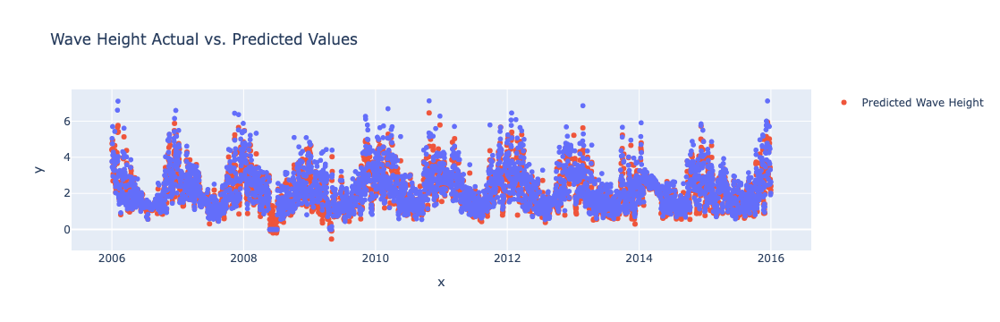

In [58]:
fig = px.scatter(features_df[test_linreg],x =features_df.index[test_linreg], y= y_wh_test,
                title = 'Wave Height Actual vs. Predicted Values',
                labels={'y_wh_test': 'Actual Wave Height', 'y_wh_pred': 'Predicted Values'}
                )
fig.add_scatter(x=features_df.index[test_linreg], y=y_wh_pred, mode ='markers', name = 'Predicted Wave Height')
fig.show()

### Linear Regression of Waveheight without rolling average DATA LEAKAGE!!

Rolling average and std deviation is left out as this may cause potential data leakage. 

In [60]:
# Define lags for different time intervals
lags = {'1_day': 1, '1_week': 7, '1_month': 30}


# Create a new DataFrame to avoid modifying the original DataFrame in place
new_df1 = pd.DataFrame()

# Create lags, rolling averages, and std deviations for all numeric columns
for column in df.select_dtypes(include='number').columns:
    # Create lags for different time intervals
    for lag_name, lag_value in lags.items():
        new_df1[f'{column}_lag_{lag_name}'] = df[column].shift(lag_value)
    
# Combine the new features with the original DataFrame
features_df1 = pd.concat([df, new_df1], axis=1)

# Drop rows with null values
features_df1 = features_df1.dropna()

# Display the modified DataFrame
print(features_df1.head())

               LATITUDE  LONGITUDE  DEPTH      VWH$      VCMX       VTP$  \
Datetime_buoy                                                              
1988-12-22        48.83      126.0   73.0  3.290833  5.575000  11.315417   
1988-12-23        48.83      126.0   73.0  4.212500  7.262500  14.342917   
1988-12-24        48.83      126.0   73.0  3.097917  5.441667  12.101250   
1988-12-25        48.83      126.0   73.0  2.649583  4.458333  11.237917   
1988-12-26        48.83      126.0   73.0  1.576250  2.675000   9.538333   

                   WDIR      WSPD       GSPD    WDIR.1  ...  HS_lag_1_month  \
Datetime_buoy                                           ...                   
1988-12-22     4.246968  7.875000  10.100000  4.076798  ...        3.981000   
1988-12-23     5.145085  4.970833   7.179167  4.983642  ...        5.604522   
1988-12-24     2.620903  3.300000   4.666667  4.218606  ...        7.755571   
1988-12-25     2.390374  2.191667   3.345833  3.257221  ...        4.529

In [61]:
#split on date for train and test
split_point = '2006-01-01'
#filter data on split point
train_linreg1= features_df1.index < split_point
test_linreg1 = features_df1.index >= split_point

In [62]:
#define X and y
X_train1 = features_df1[train_linreg1].drop(['VWH$'],axis=1)
y_wh_train1 = features_df1[train_linreg1]['VWH$']

X_test1 = features_df1[test_linreg1].drop(['VWH$'], axis=1)
y_wh_test1 = features_df1[test_linreg1]['VWH$']

In [63]:
X_train1.shape

(6219, 131)

In [64]:
y_wh_train1.shape

(6219,)

In [65]:
#PCA and Scale
pca1 = PCA(n_components=0.95)
scaler = StandardScaler()
#fit and transform to train X, transform test X
X_train_pca1 = pca1.fit_transform(scaler.fit_transform(X_train1))
X_test_pca1 = pca1.transform(scaler.transform(X_test1))

MSE Wave Height: 0.1903409072911836
MAE Wave Height: 0.31752814457906436


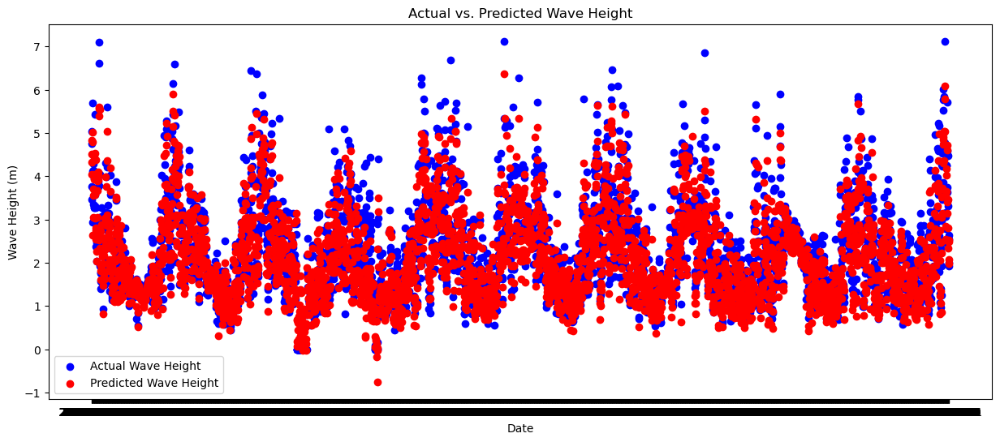

In [66]:
#Linear Regression
model_linreg1 = LinearRegression()
model_linreg1.fit(X_train_pca1, y_wh_train1)

#Predict
y_wh_pred1 = model_linreg1.predict(X_test_pca1)

#Calculate MSE and MAE
mse_wh1 = mean_squared_error(y_wh_test1,y_wh_pred1)
mae_wh1 = mean_absolute_error(y_wh_test1,y_wh_pred1)
#Print MSE and MAE
print("MSE Wave Height:", mse_wh1)
print("MAE Wave Height:", mae_wh1)

#Plot Linear Reg. with predictions and acutal values
plt.figure(figsize=(15, 6))
plt.scatter(features_df1.index[test_linreg1], y_wh_test1, label='Actual Wave Height', color='blue')
plt.scatter(features_df1.index[test_linreg1], y_wh_pred1, label='Predicted Wave Height', color='red')
plt.xlabel('Date')
plt.ylabel('Wave Height (m)')
plt.legend()
plt.title('Actual vs. Predicted Wave Height')
plt.show()

Appears that Linear Regression is still capturing the variances in wave height, and perhaps not much data leakage was occuring by incorporating rolling average and std. deviation. 

### Lasso Regression to find Important features, Wave Height
A Lasso Regression will be used and value for alpha will be optimized for lowest mse, this will allow for important features to be identified from coefficients of the Lasso Regression. 

In [67]:
#Use same X train/test from linear regression feature_df1 (no rolling avg or std.)
#scale
scaler = StandardScaler()
X_train_lasso = scaler.fit_transform(X_train1)
X_test_lasso = scaler.transform(X_test1) 

In [68]:
#use for loop to optimize for alpha value 
alpha_vals= [0.001,0.01,0.1,1,10]

best_alpha= None
best_mse = float('inf')

#iterate through alpha values
for alpha in alpha_vals:
    #fit lasso model
    lasso =Lasso(alpha=alpha)
    lasso.fit(X_train_lasso, y_wh_train1)

    #predict
    y_pred_lasso = lasso.predict(X_test_lasso)
    #MSE
    mse = mean_squared_error(y_wh_test1,y_pred_lasso)

    #check if current alpha gives a better mse
    if mse < best_mse:
        best_mse = mse
        best_alpha =alpha

print(f'Best Alpha:{best_alpha}')
print(f'Best MSE: {best_mse}')

final_lasso = Lasso(alpha=best_alpha)
final_lasso.fit(X_train_lasso, y_wh_train1)



Best Alpha:0.01
Best MSE: 0.04757043697121836


Lasso(alpha=0.01)

Feature: VCMX, Coefficient: 0.74409261363264
Feature: VWH$_lag_1_day, Coefficient: 0.12054623233610763
Feature: GSPD, Coefficient: 0.09299226803352921
Feature: WS, Coefficient: 0.07801489571202744
Feature: VTP$, Coefficient: 0.039397680745459615
Feature: ATMS, Coefficient: -0.03657992851321983
Feature: WDIR, Coefficient: 0.027240278035241546
Feature: HS, Coefficient: 0.02627681851930906
Feature: WDIR.1_lag_1_day, Coefficient: -0.01712213760628647
Feature: VWH$_lag_1_week, Coefficient: 0.015435401789163986
Feature: ANGSPR, Coefficient: 0.013173121018062417
Feature: WD, Coefficient: -0.009421125542391027
Feature: VMDSea, Coefficient: -0.009190362221726471
Feature: WS_lag_1_day, Coefficient: -0.007431845641095993
Feature: ATMS_lag_1_day, Coefficient: -0.006417428991071996
Feature: VMD, Coefficient: -0.006217799953893879
Feature: HS_lag_1_week, Coefficient: 0.004544011752677344
Feature: WDIR_lag_1_day, Coefficient: -0.00379505099023268
Feature: LATITUDE_lag_1_month, Coefficient: 0.00300396

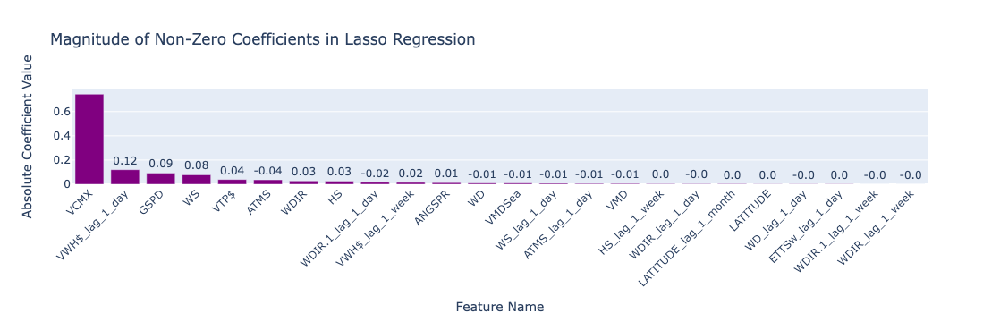

In [81]:
coefficients_lasso = final_lasso.coef_
original_feature_names = X_train1.columns.tolist()

# Identify non-zero coefficients and their corresponding feature names
non_zero_indices = np.nonzero(coefficients_lasso)[0]
non_zero_feature_names = [original_feature_names[i] for i in non_zero_indices]
non_zero_coefficients = coefficients_lasso[non_zero_indices]

# Create a list of tuples containing feature names and coefficients
feature_coefficient_pairs = list(zip(non_zero_feature_names, non_zero_coefficients))

# Sort the list based on the absolute values of coefficients in descending order
sorted_feature_coefficient_pairs_wh = sorted(feature_coefficient_pairs, key=lambda x: abs(x[1]), reverse=True)

# Print the sorted list
for feature, coefficient in sorted_feature_coefficient_pairs_wh:
    print(f'Feature: {feature}, Coefficient: {coefficient}')

# Plotly bar plot for non-zero feature names and coefficients
fig = go.Figure()

fig.add_trace(go.Bar(
    x=[pair[0] for pair in sorted_feature_coefficient_pairs_wh],
    y=[abs(pair[1]) for pair in sorted_feature_coefficient_pairs_wh],
    marker_color='purple',
    text=[round(pair[1], 2) for pair in sorted_feature_coefficient_pairs_wh],
    textposition='outside'
))

fig.update_layout(
    title='Magnitude of Non-Zero Coefficients in Lasso Regression',
    xaxis_title='Feature Name',
    yaxis_title='Absolute Coefficient Value',
    xaxis_tickangle=-45,
    showlegend=False
)

fig.show()


From the coefficients of Lasso Regression the important features in the linear regression are indentified. Although it is not a direct feature extraction there is likely overlap. A further feature importance could be conducted by analyzing the components of PCA. It appears that VCMX shows importance in prediction of wave period. This is of concern as it is defined as the highest significant wave height of that day, while this may be included in a live forecast (highest wave measured up to that point) it is not useful for a model in this analysis to make predictions using this feature. In further modelling and analysis where wave height and wave period are forecasted simultaneously this feature will be dropped. 

### Linear Regression Wave Period

In [70]:
#define X and y
X_train_wp = features_df1[train_linreg1].drop(['VTP$'],axis=1)
y_wp_train = features_df1[train_linreg1]['VTP$']

X_test_wp = features_df1[test_linreg1].drop(['VTP$'], axis=1)
y_wp_test = features_df1[test_linreg1]['VTP$']

In [71]:
#PCA and Scale
pca_wp = PCA(n_components=0.95)
scaler = StandardScaler()
#fit and transform to train X, transform test X
X_train_pca_wp = pca_wp.fit_transform(scaler.fit_transform(X_train_wp))
X_test_pca_wp = pca_wp.transform(scaler.transform(X_test_wp))

MSE Wave Period: 2.8389376832879
MAE Wave Period: 1.2839745482625176


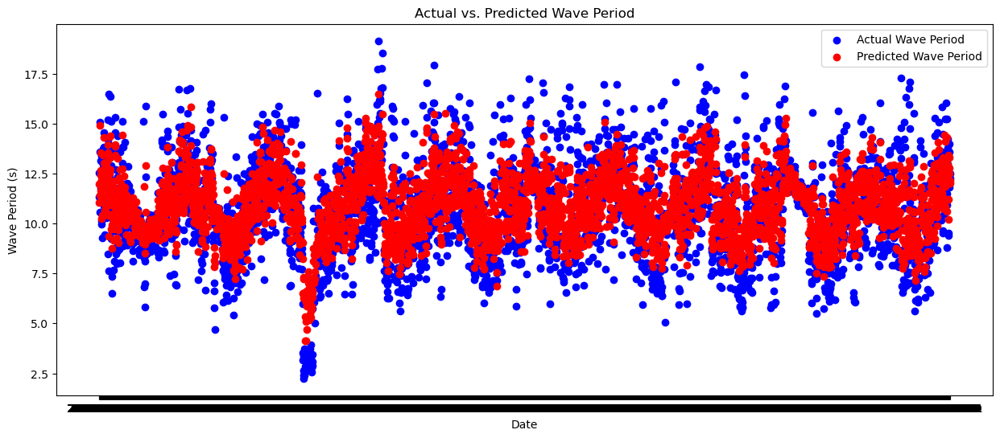

In [72]:
#Linear Regression
model_linreg_wp = LinearRegression()
model_linreg_wp.fit(X_train_pca_wp, y_wp_train)

#Predict
y_wp_pred = model_linreg_wp.predict(X_test_pca_wp)

#Calculate MSE and MAE
mse_wp = mean_squared_error(y_wp_test,y_wp_pred)
mae_wp = mean_absolute_error(y_wp_test,y_wp_pred)
#Print MSE and MAE
print("MSE Wave Period:", mse_wp)
print("MAE Wave Period:", mae_wp)

#Plot Linear Reg. with predictions and acutal values
plt.figure(figsize=(15, 6))
plt.scatter(features_df1.index[test_linreg1], y_wp_test, label='Actual Wave Period', color='blue')
plt.scatter(features_df1.index[test_linreg1], y_wp_pred, label='Predicted Wave Period', color='red')
plt.xlabel('Date')
plt.ylabel('Wave Period (s)')
plt.legend()
plt.title('Actual vs. Predicted Wave Period')
plt.show()

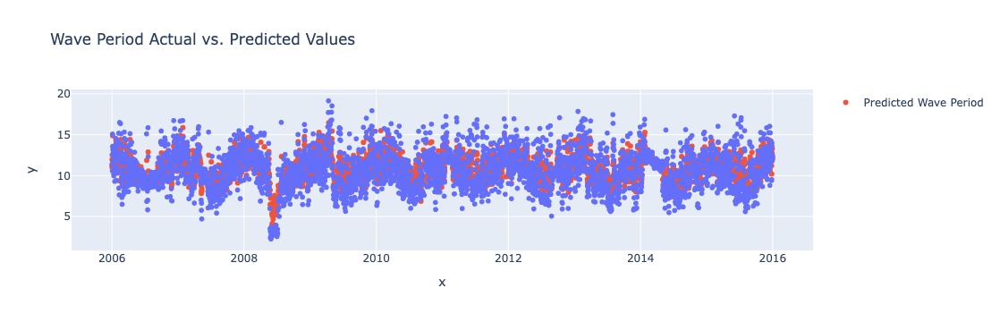

In [73]:
fig = px.scatter(features_df1[test_linreg1], x=features_df1.index[test_linreg1], y=y_wp_test,
                title='Wave Period Actual vs. Predicted Values',
                labels={'y_wp_test': 'Actual Wave Period', 'y_wp_pred': 'Predicted Values'})

# Add the scatter plot for predicted values on top
fig.add_scatter(x=features_df1.index[test_linreg1], y=y_wp_pred, mode='markers', name='Predicted Wave Period')

fig.show()


In assessing the scatter plot of predicted wave period the Variance of wave period is captured fairly well by the Linear Regression including other features. 

**RESULTS**The wave period has a MAE of about 1.2 seconds. 

### Lasso Regression to find Important Features, Wave Period

In [74]:
#Use same X train/test from linear regression feature_df1 (no rolling avg or std.)
#scale
scaler = StandardScaler()
X_train_lasso_wp = scaler.fit_transform(X_train_wp)
X_test_lasso_wp = scaler.transform(X_test_wp) 

In [78]:
#use for loop to optimize for alpha value 
alpha_vals= [0.001,0.01,0.1,1,10]

best_alpha= None
best_mse = float('inf')

#iterate through alpha values
for alpha in alpha_vals:
    #fit lasso model
    lasso_wp =Lasso(alpha=alpha)
    lasso_wp.fit(X_train_lasso_wp, y_wp_train)

    #predict
    y_pred_wp_lasso = lasso_wp.predict(X_test_lasso_wp)
    #MSE
    mse = mean_squared_error(y_wp_test,y_pred_wp_lasso)

    #check if current alpha gives a better mse
    if mse < best_mse:
        best_mse = mse
        best_alpha =alpha

print(f'Best Alpha:{best_alpha}')
print(f'Best MSE: {best_mse}')

final_lasso_wp = Lasso(alpha=best_alpha)
final_lasso_wp.fit(X_train_lasso_wp, y_wp_train)


/Users/kamiasalango/anaconda3/envs/capstone_wavepower/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.997e+01, tolerance: 3.331e+00



Best Alpha:0.001
Best MSE: 2.7144079401500387


/Users/kamiasalango/anaconda3/envs/capstone_wavepower/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.997e+01, tolerance: 3.331e+00



Lasso(alpha=0.001)

Feature: HS, Coefficient: 1.3767206100321892
Feature: VTP$_lag_1_day, Coefficient: 0.8919308554781916
Feature: MO2_lag_1_day, Coefficient: -0.8435670461961889
Feature: VWH$, Coefficient: 0.8113861163310928
Feature: WS, Coefficient: -0.729014720470581
Feature: WSPD, Coefficient: -0.6662724486702034
Feature: ETTSw, Coefficient: -0.5201128224054491
Feature: GSPD.1, Coefficient: 0.5175216330685501
Feature: WSPD.1, Coefficient: -0.5115026631794175
Feature: VWH$_lag_1_day, Coefficient: -0.49868366922717705
Feature: MO2_lag_1_week, Coefficient: -0.3599521911753164
Feature: WS_lag_1_day, Coefficient: 0.35047570021070845
Feature: HS_lag_1_week, Coefficient: 0.3441984254439723
Feature: GSPD.1_lag_1_week, Coefficient: 0.3392819923931939
Feature: MO2, Coefficient: 0.3299421934484526
Feature: MO1, Coefficient: -0.3220294120840053
Feature: TPSw, Coefficient: 0.22644001850992884
Feature: ETOT_lag_1_day, Coefficient: 0.22193895355499138
Feature: YEAR, Coefficient: -0.2013114307105879
Feature: DEPTH_la

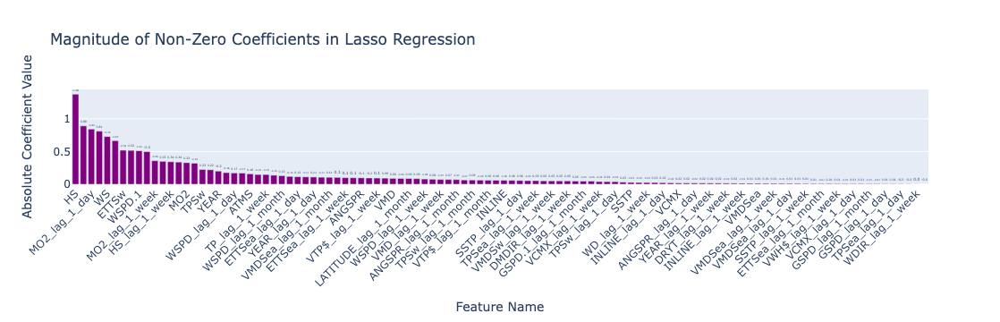

In [80]:
coefficients_lasso_wp = final_lasso_wp.coef_

original_feature_names_wp = X_train_wp.columns.tolist()

# Identify non-zero coefficients and their corresponding feature names
non_zero_indices = np.nonzero(coefficients_lasso_wp)[0]
non_zero_feature_names = [original_feature_names_wp[i] for i in non_zero_indices]
non_zero_coefficients = coefficients_lasso_wp[non_zero_indices]

# Create a list of tuples containing feature names and coefficients
feature_coefficient_pairs = list(zip(non_zero_feature_names, non_zero_coefficients))

# Sort the list based on the absolute values of coefficients in descending order
sorted_feature_coefficient_pairs = sorted(feature_coefficient_pairs, key=lambda x: abs(x[1]), reverse=True)

# Print the sorted list
for feature, coefficient in sorted_feature_coefficient_pairs:
    print(f'Feature: {feature}, Coefficient: {coefficient}')

# Plotly bar plot for non-zero feature names and coefficients
fig = go.Figure()

fig.add_trace(go.Bar(
    x=[pair[0] for pair in sorted_feature_coefficient_pairs],
    y=[abs(pair[1]) for pair in sorted_feature_coefficient_pairs],
    marker_color='purple',
    text=[round(pair[1], 2) for pair in sorted_feature_coefficient_pairs],
    textposition='outside'
))

fig.update_layout(
    title='Magnitude of Non-Zero Coefficients in Lasso Regression',
    xaxis_title='Feature Name',
    yaxis_title='Absolute Coefficient Value',
    xaxis_tickangle=-45,
    showlegend=False
)

fig.show()


Overall Wave height as well as the second spectral moment followed by wind speed, and energy of swell seem to be of importance in predicting the wave period. The second spectral moment calculation which is dependent on frequency and is closely related to wave period will be dropped in further modelling of wave period and wave height simultaneously. 

# Summary

**Summary of important Features from Lasso Regression:**
- Wave height affects prediction of wave period more than wave period affects predictions of wave height.
- Wave period overall has more features that contribute to its prediction than wave height.
- Appears that wave height and wave period show up as coefficients in predicting one another. This suggests that there is a possible relationship between wave height and wave period, or perhaps they are both independently contributing to the prediction of the other. Next Joint forecasting techniques will be explored in forecasting wave height and wave period.
- If wave period and wave height are to be forecasted together for the same time window then certain features will need to be dropped.
- Features need to be dropped in order to get a better idea of how a live forecast would work. 

In Summary, so far modelling of wave height and wave period has been using each series to predict itself. The ARIMA results showed a forecast with a mae and mse for wave height and wave period: 
- Wave Period: MSE 6.94, MAE 2.06 (s)
- Wave Height: MSE 1.47, MAE 0.91 (m)           
When other features were incorporated and a baseline Linear Regression was done the MSE and MAE was lowered.
- Wave Period: MSE 2.83, MAE 1.28 (s)
- Wave Height: MSE 0.19, MAE 0.31 (m)

Although the MSE and MAE error values were lowered by incorporating other features, these values may be overly optimistic as further feature selection and refinement needs to be done to get a better idea of a live forecast. It does however show that wave period and wave height may be forecasted independantly, that is either one or the other may be forecasted with lower error range than the benchmark error ranges defined in this analysis. Next ensemble machine learning methods will be used as a forecasting method for wave height and wave period. 